In [43]:
import os
import math
import numpy as np
import pandas as pd
import json
import requests
import re
import datetime
from datetime import datetime as dt

import matplotlib.pyplot as plt  

import plotly.express as px
import plotly.graph_objs as go

In [44]:
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K

# PARAMETRES

In [3]:
dir_path = r'D:\DATA_ANALYSE\Meteo_France\QUOT' # YOUR_DIR_PATH
dep = ['08']# list of department numbers 
option = 'RR-T-Vent' # one of the options file for the Daily datasets : 'RR-T-Vent' or 'autres-parametres', None if you want all

station_name = 'CHARLEVILLE' # extract by station name if you know it exactly, else None and enter the station_id
station_id = 8105005 # extract by station id if you know it, else None and enter the exact station_name

data_freq = 'DAY' # one of the options : '6MIN', 'HOUR', 'DAY', 'MONTH', 'DECA', 'DECAGRO'


# DOWNLOAD

In [4]:
data_type = {'6MIN' : '6569ad61106d1679c93cdf77/',
             'HOUR' : '6569b4473bedf2e7abad3b72/',
             'DAY' : '6569b51ae64326786e4e8e1a/',
             'MONTH' : '6569b3d7d193b4daf2b43edc/',
             'DECA' : '6569b4a48a4161faec6b2779/',
             'DECAGRO' : '6569af36ba0c3d2f9d4bf98c/'}

In [5]:
# general link of the datasets
url = 'https://www.data.gouv.fr/api/2/datasets/' + data_type[data_freq]

In [6]:
response = requests.get(url)
response

<Response [200]>

In [7]:
# finding how many pages for all datasets
nb_pages = json.loads(response.text)['resources']['total']
nb_pages

626

In [8]:
url_dep = url + f'/resources/?page=1&page_size={nb_pages}&type=main'

response = requests.get(url_dep)
data = response.json()

In [9]:
# grab all the page to find the department datasets
compte = 0
for k in range(len(data['data'])):
    titre = data['data'][k]['title']
    m=re.search('departement_([0-9]{2,3})_', titre)
    if m.group(1) in dep and (option is None or (option is not None and option in titre)):        
        url1 = data['data'][k]['url']
        format = data['data'][k]['format']
        resp = requests.get(url1)
        if resp.status_code == 200:
            with open(os.path.join(dir_path, titre + '.' + format), 'wb') as file:
                file.write(resp.content)  
                compte += 1
        else:
            print('problem with ', titre)
print(compte, ' file(s) downloaded')

3  file(s) downloaded


In [12]:
# list the files of the department(s)
liste_file = []
for file_path in os.listdir(dir_path):
    # check if current file_path is a file
    if os.path.isfile(os.path.join(dir_path, file_path)):
        # add filename to list
        liste_file.append(file_path)

data_files = []
for file_n in liste_file:
    m=re.search('departement_([0-9]{2,3})_', file_n)
    if m is not None and m.group(1) in dep and (option is None or (option is not None and option in file_n)): 
        data_files.append(file_n)

print(data_files)

['QUOT_departement_08_periode_1871-1949_RR-T-Vent.csv.gz', 'QUOT_departement_08_periode_1950-2022_RR-T-Vent.csv.gz', 'QUOT_departement_08_periode_2023-2024_RR-T-Vent.csv.gz']


# OPTION 1 : dataset of all the stations of the department(s)

In [13]:
df_all = pd.DataFrame()
for file_name in data_files:
    df_0 = pd.read_csv(os.path.join(dir_path, file_name), sep = ';')    
    df_all = pd.concat([df_all, df_0], ignore_index = True)
df_all.head()

,NUM_POSTE,NOM_USUEL,LAT,LON,ALTI,AAAAMMJJ,RR,QRR,TN,QTN,...,DXI2,QDXI2,HXI2,QHXI2,FXI3S,QFXI3S,DXI3S,QDXI3S,HXI3S,QHXI3S
0,8016001,AOUSTE,49.8,4.316667,204,18800601,0.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8016001,AOUSTE,49.8,4.316667,204,18800602,0.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8016001,AOUSTE,49.8,4.316667,204,18800603,0.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8016001,AOUSTE,49.8,4.316667,204,18800604,0.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8016001,AOUSTE,49.8,4.316667,204,18800605,0.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Save your dataset in a file

In [14]:
file_path = os.path.join(dir_path, 'my_department.csv')
df_all.to_csv(file_path, sep = ';', index = False) # compression='gzip'

# OPTION 2 : dataset of your selected station

In [15]:
df_station = pd.DataFrame()
for file_name in data_files:
    df0 = pd.read_csv(os.path.join(dir_path, file_name), sep = ';')
    if station_id is not None:
        df0 = df0[df0['NUM_POSTE'] == station_id]
    else:
        df0 = df0[df0['NOM_USUEL'] == station_name]
    df_station = pd.concat([df_station, df0], ignore_index = True)
df_station.head()

,NUM_POSTE,NOM_USUEL,LAT,LON,ALTI,AAAAMMJJ,RR,QRR,TN,QTN,...,DXI2,QDXI2,HXI2,QHXI2,FXI3S,QFXI3S,DXI3S,QDXI3S,HXI3S,QHXI3S
0,8105005,CHARLEVILLE-MEZ,49.782833,4.643167,145,19900101,0.0,1.0,-2.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8105005,CHARLEVILLE-MEZ,49.782833,4.643167,145,19900102,0.0,1.0,-2.2,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8105005,CHARLEVILLE-MEZ,49.782833,4.643167,145,19900103,0.0,1.0,0.2,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8105005,CHARLEVILLE-MEZ,49.782833,4.643167,145,19900104,0.0,1.0,-1.6,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8105005,CHARLEVILLE-MEZ,49.782833,4.643167,145,19900105,0.0,1.0,-0.2,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Save your dataset in a file

In [16]:
file_path = os.path.join(dir_path, 'my_station.csv')
df_station.to_csv(file_path, sep = ';', index = False)

# DATA EXPLORATION

## useful functions

In [6]:
def transfo_an(x):
    return str(x)[:4] + '-' + str(x)[4:6] + '-' + str(x)[6:]


def select_feature(df, feat):
    df1 = df.copy()
    df1['AAAAMMJJ'] = df1['AAAAMMJJ'].apply(lambda x: str(x)[:4]+'-'+str(x)[4:6] + '-' + str(x)[6:])
    df1['AAAAMMJJ'] = pd.to_datetime(df1['AAAAMMJJ'])
    return df1[['AAAAMMJJ', feat]]
    

def select_feature2(df, feat):
    df1 = df.copy()
    df1['AAAAMMJJ'] = df1['AAAAMMJJ'].apply(lambda x: str(x)[:4]+'-'+str(x)[4:6] + '-' + str(x)[6:])
    df1['AAAAMMJJ'] = pd.to_datetime(df1['AAAAMMJJ'])
    return df1[['NUM_POSTE', 'NOM_USUEL', 'AAAAMMJJ', feat]]


def parse_date(df):
    # convert the date column into a datetime object
    df1 = df.copy()
    df1['DATE'] = pd.to_datetime(df1['DATE'])
    # extract the day, month, and year components
    df1['day'] = df1['DATE'].dt.day
    df1['month'] = df1['DATE'].dt.month
    df1['year'] = df1['DATE'].dt.year
    return df1


def to_num(df, feat):
    df1 = df.copy()
    df1[feat] = df1[feat].astype('str')
    df1[feat] = df1[feat].apply(lambda x : x.replace(',', '.')).astype('float')
    return df1


def df_tempe(df, param):
    df1 = select_feature(df, param)
    df1 = to_num(df1, param)
    return df1

def df_tempe2(df, param):
    df1 = select_feature2(df, param)
    df1 = to_num(df1, param)
    return df1

In [120]:
freq_nom = {'Y' : ['ans', 'Année', ' annuelle'], 'M' : ['mois', 'Mois', ' mensuelle']}

def graph(colors, colors_t, params, features, unites, df, aggs, rolls, freqs, titre):
    fig = go.Figure()  
    
    for color, color_t, param, feature, unite, agg, roll, freq in zip(colors, colors_t, params, features, unites, aggs, rolls, freqs):
        m = df[param + ' ' +agg].rolling(roll, center=True).agg(['mean', 'std'])
        upper = m['mean'] + m['std']
        lower = (m['mean'] - m['std'])    
        
        fig.add_trace(go.Scatter(x=m.index,
                                 y=m["mean"],
                                 mode='lines',
                                 name = param + ' moyenne sur ' + str(roll) + ' ' + freq_nom[freq][0] +'<br>(+/-1 écart-type)',
                                 hovertemplate = 'Année %{x|%Y}<br>' + param + ' moyenne sur ' + str(roll) + ' ' + freq_nom[freq][0] + ' = ' + '%{y:.1f}<extra></extra>',
                                 line=dict(color=color, width=2, dash = 'dash', shape='spline'),                             
                                 ))
        fig.add_trace(go.Scatter(x=df.index,
                                 y=df[param + ' ' +agg],
                                 mode='lines',
                                 name = param + ' moyenne ' + freq_nom[freq][2],                                                         
                                 hovertemplate = 'Année %{x|%Y}<br>' + param + ' moyenne = ' + '%{y:.1f}<extra></extra>',
                                 line=dict(color=color, width=2),
                                 opacity = 0.3))
        fig.add_trace(go.Scatter(x=m.index,
                                 y=upper,                             
                                 line=dict(color=color, width=2, dash = 'dash', shape='spline'),
                                 showlegend=False,
                                 name = "",                             
                                 hovertemplate = 'Année %{x|%Y}<br>' + param + ' moy +1 écart-type = ' + '%{y:.1f}',
                                ))
        fig.add_trace(go.Scatter(x=m.index,
                                 y=lower,                             
                                 line=dict(color=color, width=2, dash = 'dash', shape='spline'),
                                 showlegend = False,
                                 fill = 'tonexty',
                                 fillcolor = color_t,
                                 name = "",                             
                                 hovertemplate = 'Année %{x|%Y}<br>' + param + ' moy -1 écart-type = ' + '%{y:.1f}',
                                 opacity = 0.3))
    
    fig.update_layout(height=600,plot_bgcolor='white',
                          legend=dict(x=1.01,y=1, font=dict(size=12,),bordercolor='black',borderwidth=1),
                         title = dict(text= titre, x=0.5))
    fig.update_xaxes(
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='white')
        
    fig.update_yaxes(
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey',
        title = feature + unite
        )
    fig.add_annotation(
        x="2021", y=-0.2, # position
        yref='paper',
        text="Données : Meteo France<br>https://meteo.data.gouv.fr/", # text
        font = dict(color = 'black'),
        showarrow=False    
       )
    
        
    fig.show()

## Load a file

In [8]:
dir_path = r'D:\DATA_ANALYSE\Meteo_France\QUOT'
file_name = 'my_station.csv'

df = pd.read_csv(os.path.join(dir_path, file_name), sep = ';')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12412 entries, 0 to 12411
Data columns (total 56 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   NUM_POSTE  12412 non-null  int64  
 1   NOM_USUEL  12412 non-null  object 
 2   LAT        12412 non-null  float64
 3   LON        12412 non-null  float64
 4   ALTI       12412 non-null  int64  
 5   AAAAMMJJ   12412 non-null  int64  
 6   RR         12412 non-null  float64
 7   QRR        12412 non-null  float64
 8   TN         12412 non-null  float64
 9   QTN        12412 non-null  float64
 10  HTN        12355 non-null  float64
 11  QHTN       12356 non-null  float64
 12  TX         12412 non-null  float64
 13  QTX        12412 non-null  float64
 14  HTX        12359 non-null  float64
 15  QHTX       12361 non-null  float64
 16  TM         12398 non-null  float64
 17  QTM        12398 non-null  float64
 18  TNTXM      12412 non-null  float64
 19  QTNTXM     12412 non-null  float64
 20  TAMPLI

## features selection

In [9]:
df1 = df[['AAAAMMJJ', 'RR', 'TN', 'TX', 'TM', 'TNTXM', 'TAMPLI', 'FFM']].copy()
df1

,AAAAMMJJ,RR,TN,TX,TM,TNTXM,TAMPLI,FFM
0,19900101,0.0,-2.0,-0.7,-1.4,-1.4,1.3,3.3
1,19900102,0.0,-2.2,1.4,-0.7,-0.4,3.6,2.4
2,19900103,0.0,0.2,2.1,1.3,1.2,1.9,5.3
3,19900104,0.0,-1.6,0.6,-0.7,-0.5,2.2,4.0
4,19900105,0.0,-0.2,2.4,1.3,1.1,2.6,0.8
...,...,...,...,...,...,...,...,...
12407,20240111,0.0,-7.2,5.2,-1.7,-1.0,12.4,1.5
12408,20240112,0.0,-3.9,1.1,0.5,-1.4,5.0,2.4
12409,20240113,0.0,-1.7,0.0,-0.9,-0.9,1.7,1.6
12410,20240114,0.0,-4.6,-0.7,-3.1,-2.7,3.9,1.8


In [10]:
df1['AAAAMMJJ'] = df1['AAAAMMJJ'].apply(lambda x: str(x)[:4]+'-'+str(x)[4:6] + '-' + str(x)[6:])
df1['AAAAMMJJ'] = pd.to_datetime(df1['AAAAMMJJ'])
df1 = df1[df1['AAAAMMJJ'].apply(lambda x:x.year) < datetime.date.today().year]
df1.set_index("AAAAMMJJ", inplace=True)
df1

,RR,TN,TX,TM,TNTXM,TAMPLI,FFM
AAAAMMJJ,,,,,,,
1990-01-01,0.0,-2.0,-0.7,-1.4,-1.4,1.3,3.3
1990-01-02,0.0,-2.2,1.4,-0.7,-0.4,3.6,2.4
1990-01-03,0.0,0.2,2.1,1.3,1.2,1.9,5.3
1990-01-04,0.0,-1.6,0.6,-0.7,-0.5,2.2,4.0
1990-01-05,0.0,-0.2,2.4,1.3,1.1,2.6,0.8
...,...,...,...,...,...,...,...
2023-12-27,0.2,4.8,9.8,7.8,7.3,5.0,3.3
2023-12-28,0.0,5.4,11.1,9.6,8.3,5.7,4.1
2023-12-29,1.4,8.0,10.2,9.4,9.1,2.2,4.9


**Parameter for frequency resample :**  
B         business day frequency  
C         custom business day frequency (experimental)  
D         calendar day frequency  
W         weekly frequency  
M         month end frequency  
SM        semi-month end frequency (15th and end of month)  
BM        business month end frequency  
CBM       custom business month end frequency  
MS        month start frequency  
SMS       semi-month start frequency (1st and 15th)  
BMS       business month start frequency  
CBMS      custom business month start frequency  
Q         quarter end frequency  
BQ        business quarter endfrequency  
QS        quarter start frequency  
BQS       business quarter start frequency  
A         year end frequency  
BA, BY    business year end frequency  
AS, YS    year start frequency  
BAS, BYS  business year start frequency  
BH        business hour frequency  
H         hourly frequency  
T, min    minutely frequency  
S         secondly frequency  
L, ms     milliseconds  
U, us     microseconds  
N         nanoseconds  

## Annual statistics

In [11]:
df1_year = df1.resample("AS").agg(['mean', 'sum', 'min', 'max'])
df1_year.columns = [' '.join(col).strip() for col in df1_year.columns.values]
df1_year

,RR mean,RR sum,RR min,RR max,TN mean,TN sum,TN min,TN max,TX mean,TX sum,...,TNTXM min,TNTXM max,TAMPLI mean,TAMPLI sum,TAMPLI min,TAMPLI max,FFM mean,FFM sum,FFM min,FFM max
AAAAMMJJ,,,,,,,,,,,,,,,,,,,,,
1990-01-01,2.317534,845.9,0.0,42.8,4.264110,1556.4,-9.6,17.3,14.923288,5447.0,...,-4.2,22.2,10.659178,3890.6,1.0,24.8,2.673151,975.7,0.1,9.9
1991-01-01,1.952329,712.6,0.0,28.6,3.400000,1241.0,-16.7,18.0,13.655890,4984.4,...,-10.4,23.2,10.255890,3743.4,0.7,24.8,2.620000,956.3,0.3,7.3
1992-01-01,2.500820,915.3,0.0,35.8,4.571858,1673.3,-11.2,18.7,14.396995,5269.3,...,-6.1,26.4,9.825137,3596.0,0.8,23.8,2.492350,912.2,0.1,9.0
1993-01-01,2.930959,1069.8,0.0,41.2,4.244384,1549.2,-13.8,16.5,13.769315,5025.8,...,-8.2,22.1,9.524932,3476.6,0.9,23.4,2.667123,973.5,0.2,8.4
1994-01-01,2.485205,907.1,0.0,39.2,5.749041,2098.4,-10.2,18.4,15.029041,5485.6,...,-4.4,24.9,9.280000,3387.2,0.9,24.2,2.701918,986.2,0.3,8.4
1995-01-01,2.723288,994.0,0.0,46.4,5.264384,1921.5,-10.0,17.4,14.841644,5417.2,...,-5.3,25.4,9.577260,3495.7,1.3,22.6,2.685479,980.2,0.1,7.5
1996-01-01,1.931694,707.0,0.0,32.6,3.440984,1259.4,-13.9,17.4,12.962842,4744.4,...,-9.5,22.5,9.521858,3485.0,0.8,22.6,2.649727,969.8,0.5,7.2
1997-01-01,2.302466,840.4,0.0,38.6,4.465205,1629.8,-17.5,17.9,14.812329,5406.5,...,-12.8,23.3,10.347123,3776.7,1.0,24.0,2.519726,919.7,0.2,8.8
1998-01-01,2.812055,1026.4,0.0,37.6,4.685753,1710.3,-13.4,16.6,13.918904,5080.4,...,-6.8,23.8,9.233151,3370.1,1.0,23.1,2.604110,950.5,0.1,8.0


In [34]:
df1_year.describe()

RR                                       TN               \
            mean          sum   min        max       mean          sum   
count  34.000000    34.000000  34.0  34.000000  34.000000    34.000000   
mean    2.540527   926.361765   0.0  36.732353   5.027334  1833.138235   
std     0.394724   144.723699   0.0   9.537127   0.701110   257.308653   
min     1.786849   652.200000   0.0  21.000000   3.400000  1241.000000   
25%     2.306233   841.775000   0.0  30.150000   4.688151  1683.750000   
50%     2.482903   903.150000   0.0  36.350000   5.137220  1877.600000   
75%     2.862645  1047.025000   0.0  40.525000   5.449178  1988.950000   
max     3.207671  1170.800000   0.0  69.900000   6.589589  2405.200000   

                                    TX               ...      TNTXM  \
             min        max       mean          sum  ...        min   
count  34.000000  34.000000  34.000000    34.000000  ...  34.000000   
mean  -11.820588  18.197059  15.049237  5486.805882  ...  -6.079412   
std     2.649732   0.977469   0.956612   347.264679  ...   2.539838   
min   -17.500000  16.300000  12.962842  4744.400000  ... -12.800000   
25%   -13.700000  17.400000  14.426582  5276.500000  ...  -7.125000   
50%   -11.200000  18.500000  14.906301  5439.900000  ...  -5.750000   
75%   -10.025000  18.975000  15.665370  5696.025000  ...  -4.425000   
max    -6.400000  20.100000  17.064658  6228.600000  ...  -0.700000   

                     TAMPLI                                           FFM  \
             max       mean          sum        min        max       mean   
count  34.000000  34.000000    34.000000  34.000000  34.000000  34.000000   
mean   24.347059  10.021902  3653.667647   0.914706  23.779412   2.509333   
std     1.575232   0.725721   260.474334   0.203205   1.517530   0.147446   
min    21.800000   8.635792  3160.700000   0.400000  20.900000   2.289807   
25%    23.225000   9.529384  3483.325000   0.800000  22.600000   2.378669   
50%    24.300000   9.864795  3600.650000   0.900000  23.700000   2.503675   
75%    25.375000  10.361918  3768.675000   1.000000  24.800000   2.624368   
max    28.000000  11.772329  4296.900000   1.400000  28.200000   2.806849   

                                          
               sum        min        max  
count    34.000000  34.000000  34.000000  
mean    909.170588   0.347059   7.600000  
std      59.778102   0.204843   0.898484  
min     772.900000   0.000000   5.800000  
25%     865.050000   0.200000   7.000000  
50%     908.300000   0.400000   7.650000  
75%     955.150000   0.500000   8.175000  
max    1024.500000   0.800000   9.900000  

[8 rows x 28 columns]

### Annual Temperatures

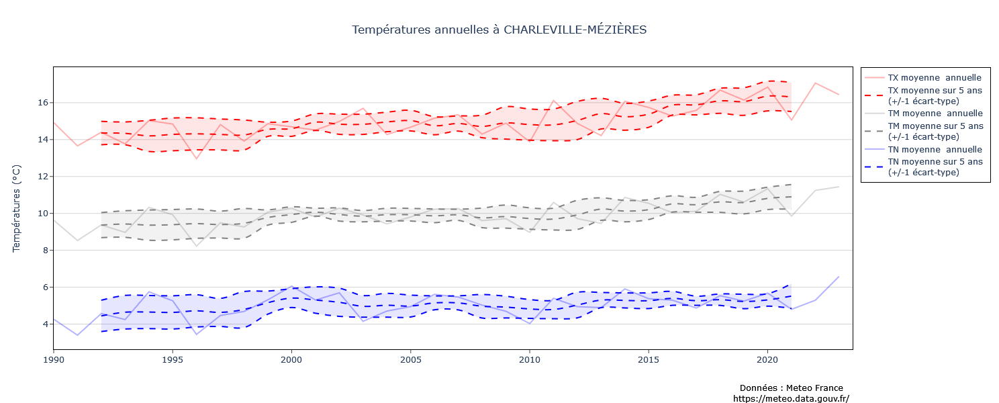

In [24]:
graph(['blue', 'grey', 'red'],['rgba(0, 0, 255, 0.1)', 'rgba(125, 125, 125, 0.1)', 'rgba(255, 0, 0, 0.1)'],
      ['TN', 'TM', 'TX'], ['Températures']*3, [' (°C)']*3, df1_year, ['mean']*3, [5]*3, ['Y']*3,
     'Températures annuelles à CHARLEVILLE-MÉZIÈRES')

### Annual Precipitations

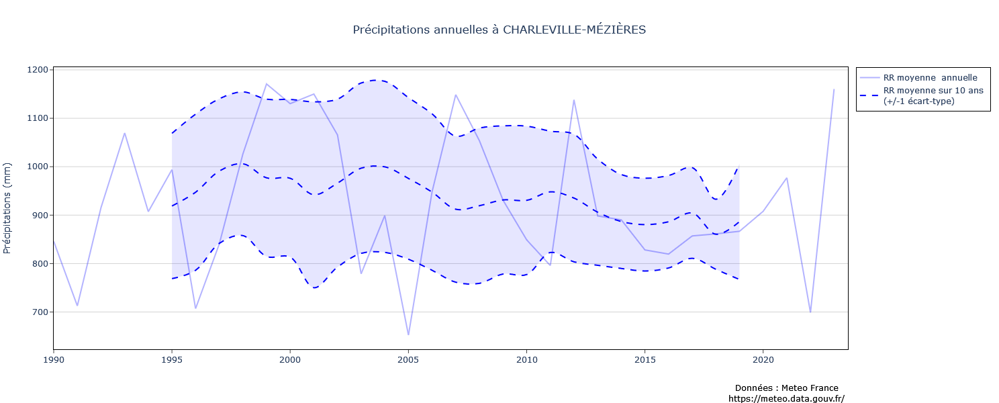

In [25]:
graph(['blue'],['rgba(0, 0, 255, 0.1)'], ['RR'], ['Précipitations'], [' (mm)'], df1_year, ['sum'], [10], ['Y'], 'Précipitations annuelles à CHARLEVILLE-MÉZIÈRES')

## Monthly statistics

In [12]:
df1_month = df1.resample("MS").agg(['mean', 'sum', 'min', 'max'])
df1_month.columns = [' '.join(col).strip() for col in df1_month.columns.values]

df1_month

,RR mean,RR sum,RR min,RR max,TN mean,TN sum,TN min,TN max,TX mean,TX sum,...,TNTXM min,TNTXM max,TAMPLI mean,TAMPLI sum,TAMPLI min,TAMPLI max,FFM mean,FFM sum,FFM min,FFM max
AAAAMMJJ,,,,,,,,,,,,,,,,,,,,,
1990-01-01,2.858065,88.6,0.0,42.4,1.519355,47.1,-4.9,8.9,5.516129,171.0,...,-2.1,10.3,3.996774,123.9,1.0,10.1,3.348387,103.8,0.6,8.4
1990-02-01,5.535714,155.0,0.0,31.6,1.878571,52.6,-5.1,7.1,11.596429,324.7,...,2.3,12.0,9.717857,272.1,3.0,19.9,4.332143,121.3,0.5,9.9
1990-03-01,0.703226,21.8,0.0,6.0,0.751613,23.3,-5.6,9.4,12.432258,385.4,...,0.8,11.9,11.680645,362.1,3.2,23.0,2.732258,84.7,0.5,8.9
1990-04-01,2.490000,74.7,0.0,19.0,1.276667,38.3,-5.2,9.0,13.093333,392.8,...,0.6,13.1,11.816667,354.5,4.0,22.2,2.900000,87.0,0.9,5.4
1990-05-01,0.535484,16.6,0.0,9.4,4.358065,135.1,-1.6,11.9,20.700000,641.7,...,7.7,16.6,16.341935,506.6,7.7,23.2,1.890323,58.6,0.6,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-01,3.309677,102.6,0.0,20.8,12.429032,385.3,5.3,20.1,23.867742,739.9,...,12.4,23.5,11.438710,354.6,3.3,19.6,2.212903,68.6,0.9,5.9
2023-09-01,2.553333,76.6,0.0,21.5,10.910000,327.3,4.5,16.9,24.510000,735.3,...,11.6,23.1,13.600000,408.0,4.5,20.3,1.783333,53.5,0.5,3.6
2023-10-01,4.651613,144.2,0.0,23.4,7.770968,240.9,-1.9,14.6,17.403226,539.5,...,5.3,17.5,9.632258,298.6,3.3,18.0,2.412903,74.8,0.6,5.5


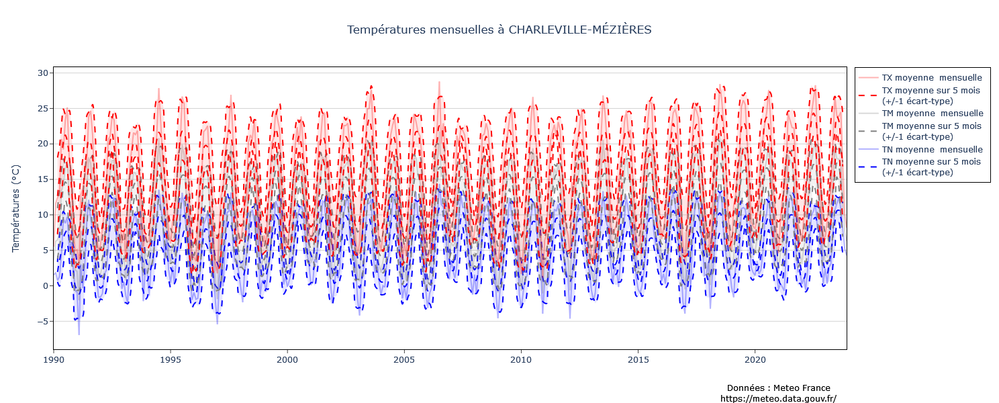

In [26]:
graph(['blue', 'grey', 'red'],['rgba(0, 0, 255, 0.1)', 'rgba(125, 125, 125, 0.1)', 'rgba(255, 0, 0, 0.1)'],
      ['TN', 'TM', 'TX'], ['Températures']*3, [' (°C)']*3, df1_month, ['mean']*3, [5]*3, ['M']*3,
     'Températures mensuelles à CHARLEVILLE-MÉZIÈRES')

### Month by Month Temperatures

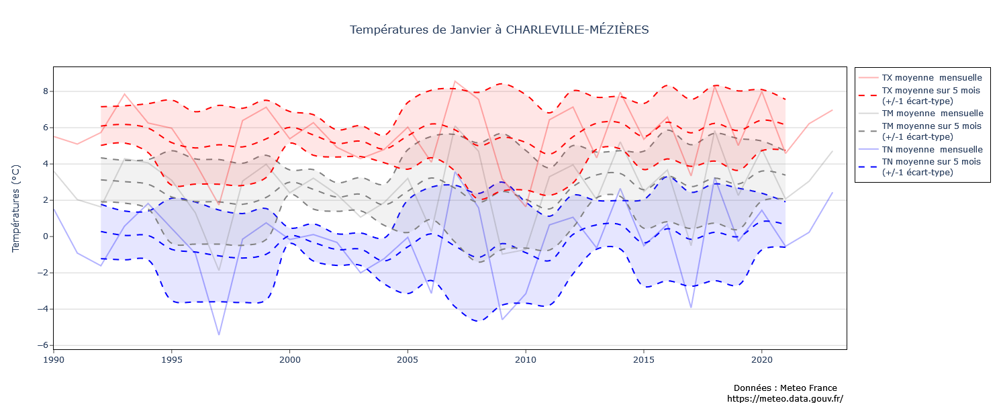

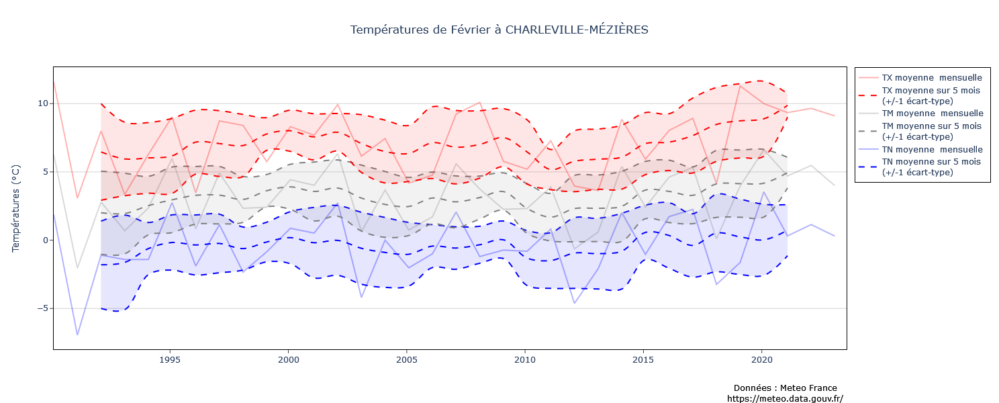

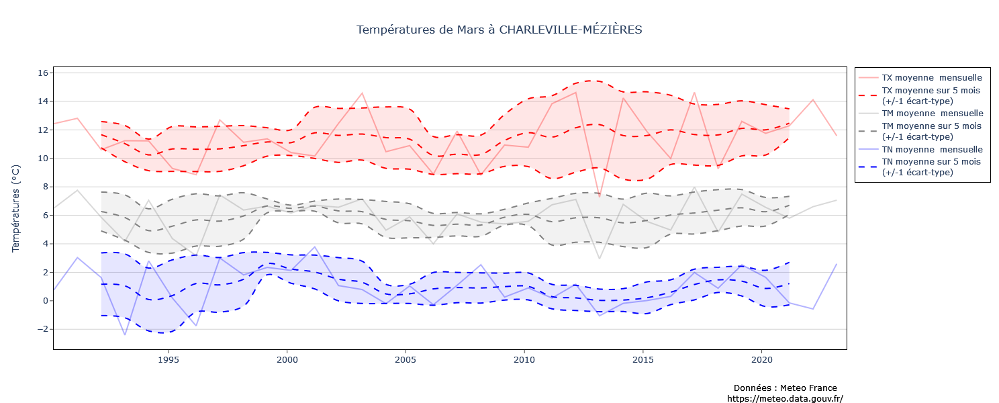

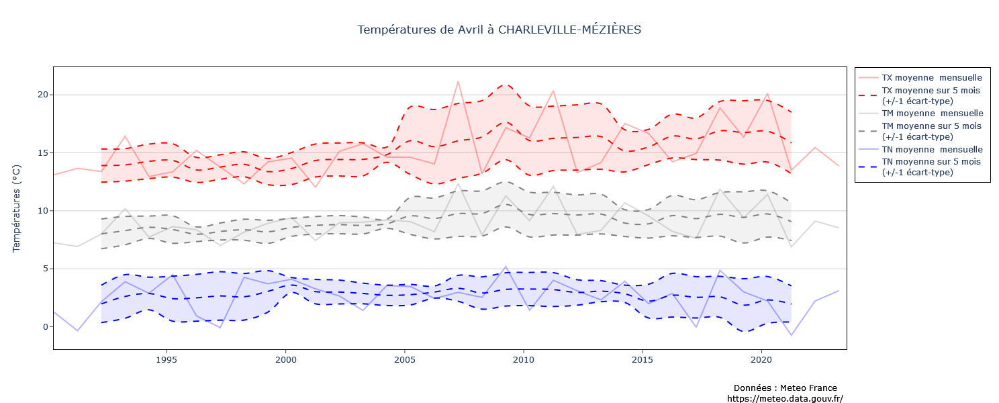

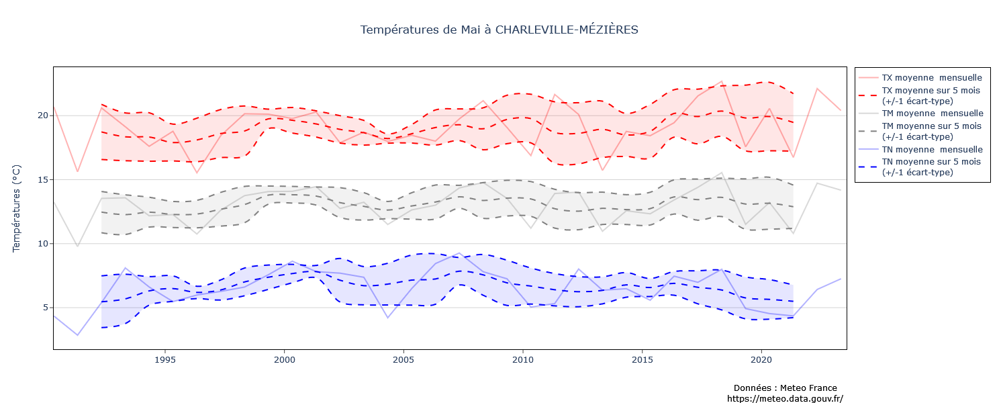

...

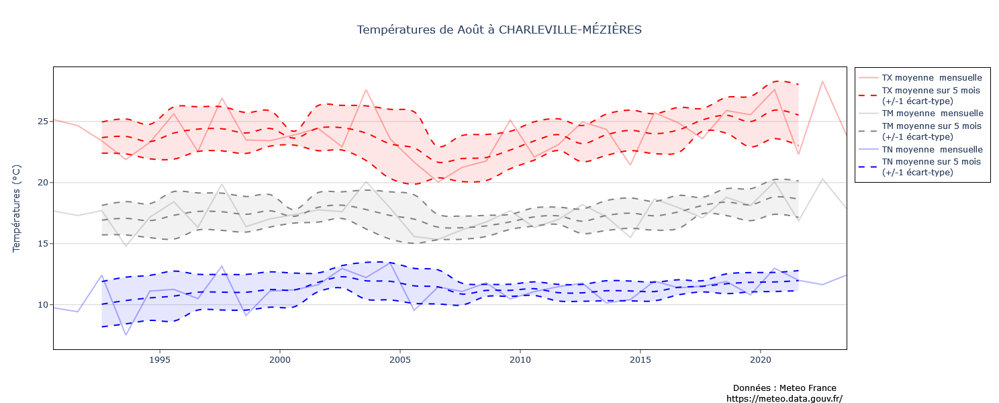

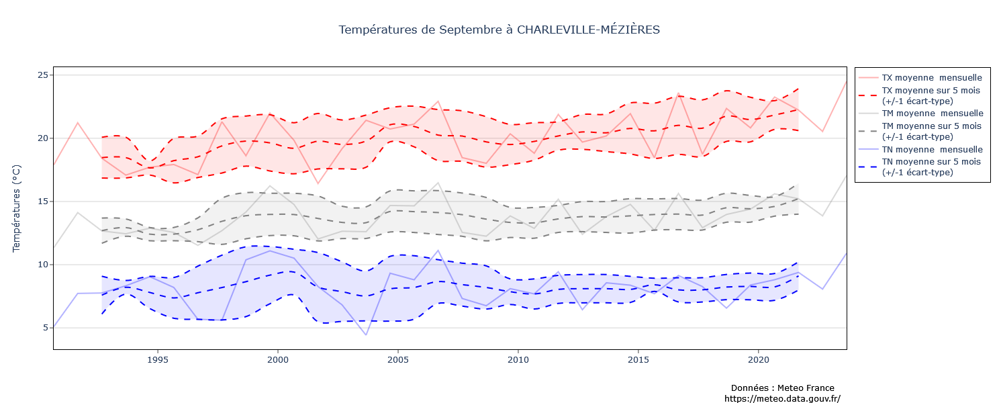

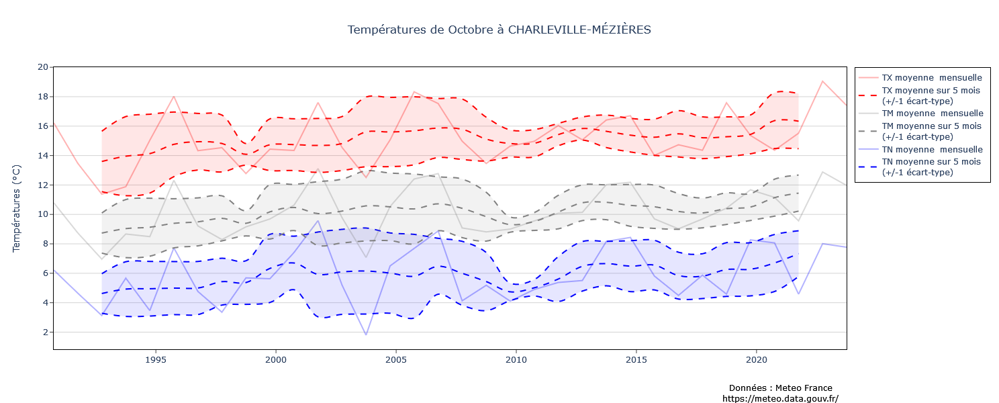

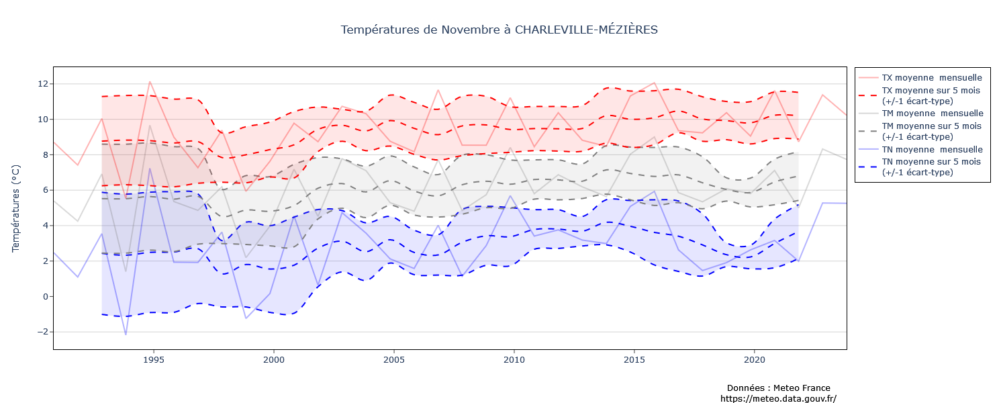

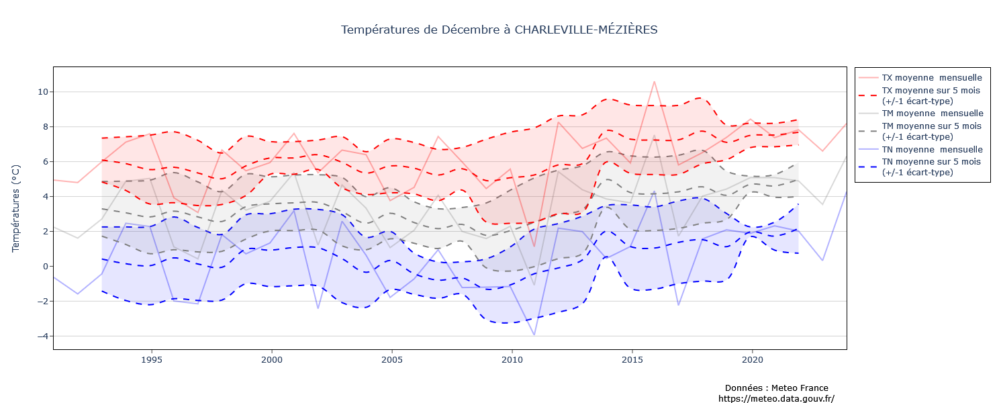

In [27]:
mois = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre'] 
for k in range(1, 13):
    graph(['blue', 'grey', 'red'],['rgba(0, 0, 255, 0.1)', 'rgba(125, 125, 125, 0.1)', 'rgba(255, 0, 0, 0.1)'],
      ['TN', 'TM', 'TX'], ['Températures']*3, [' (°C)']*3,df1_month[df1_month.index.month == k], ['mean']*3, [5]*3, ['M']*3,
     f'Températures de {mois[k-1]} à CHARLEVILLE-MÉZIÈRES')

### Month by Month Precipitations

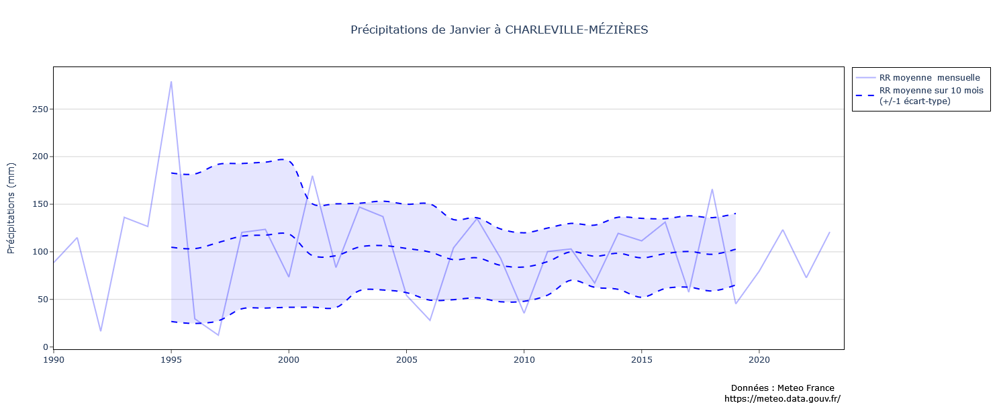

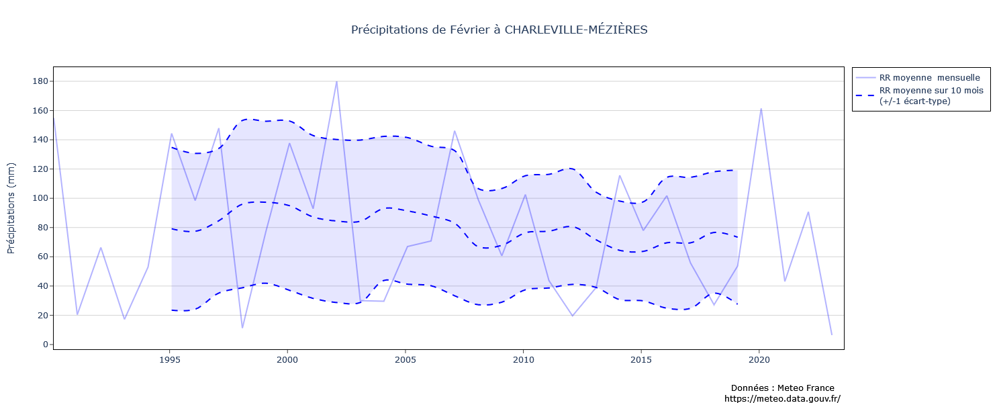

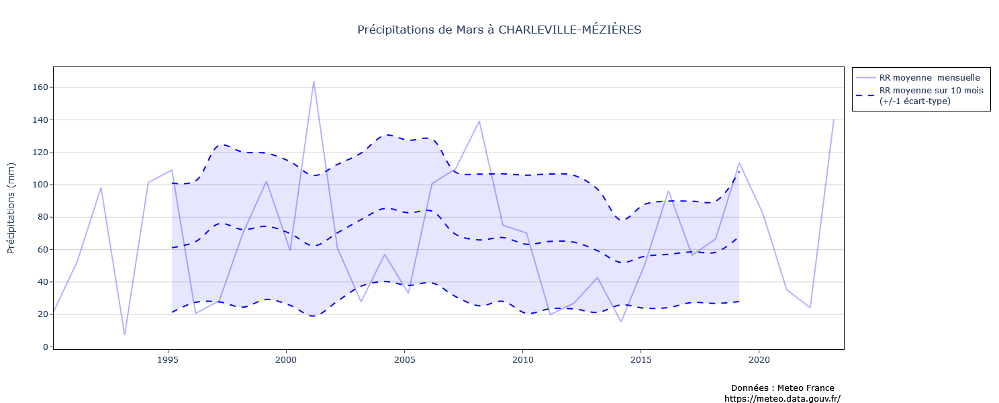

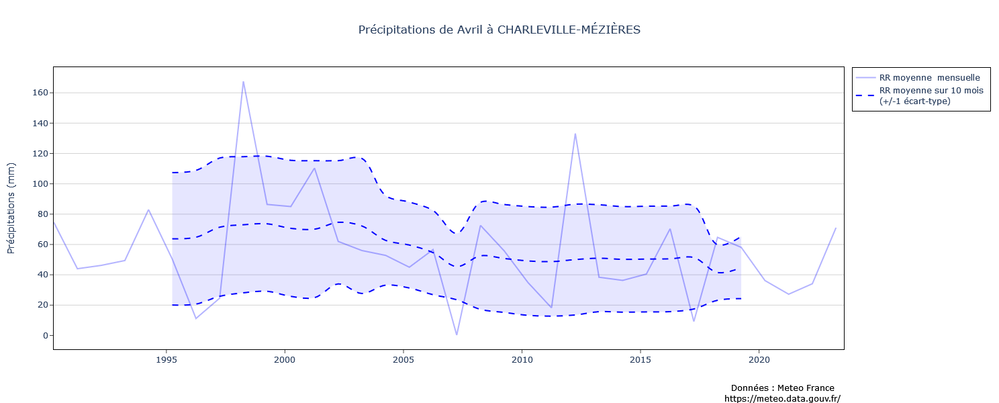

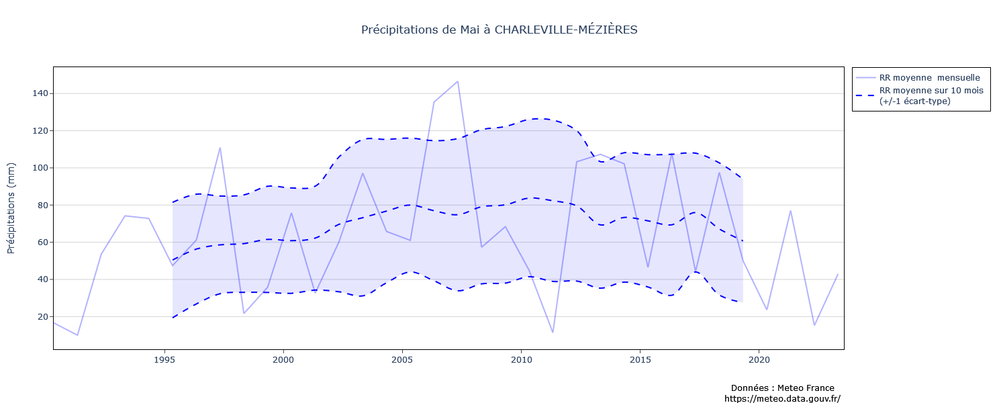

...

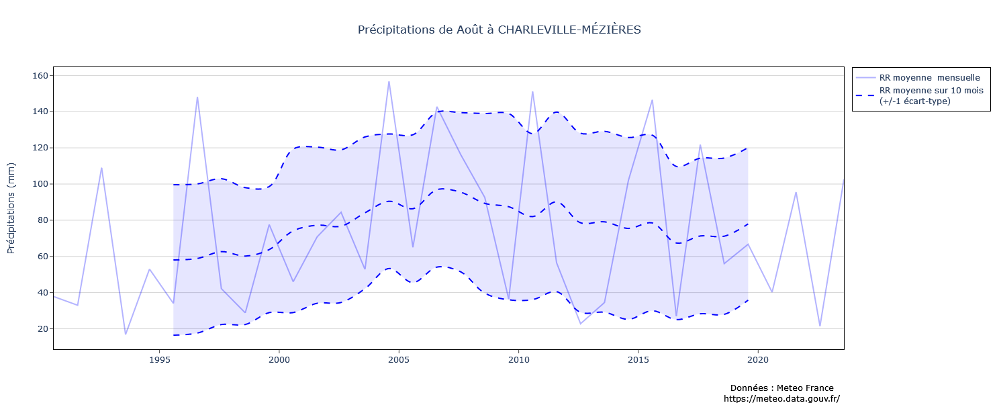

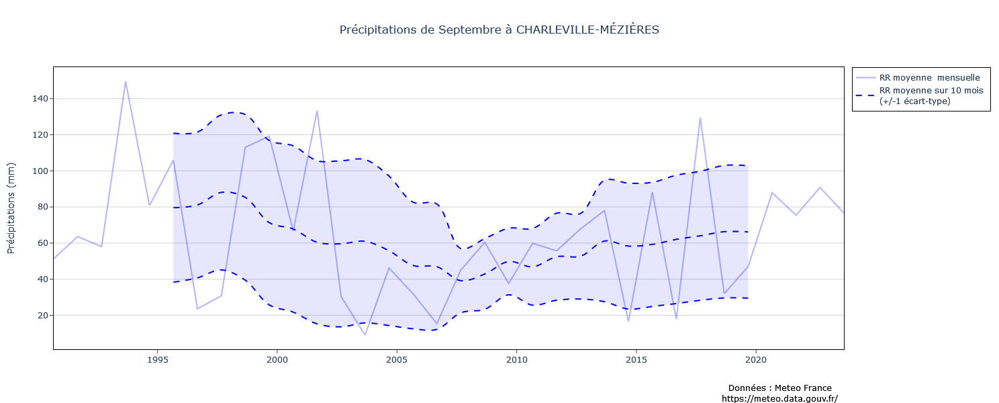

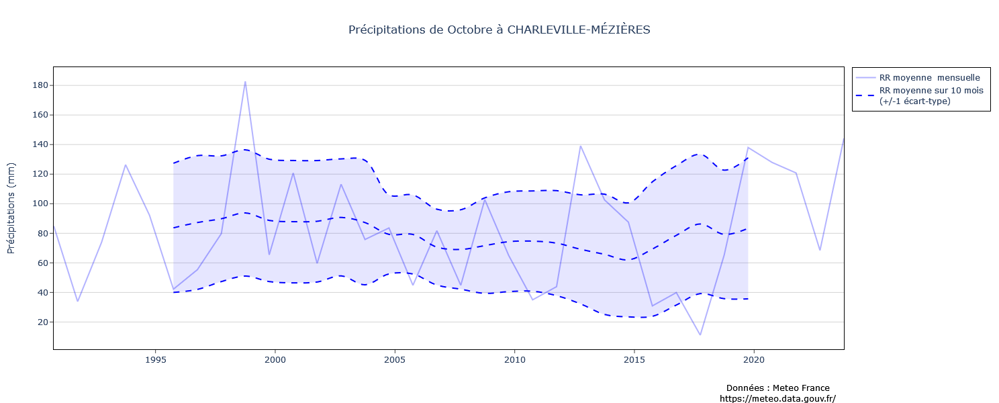

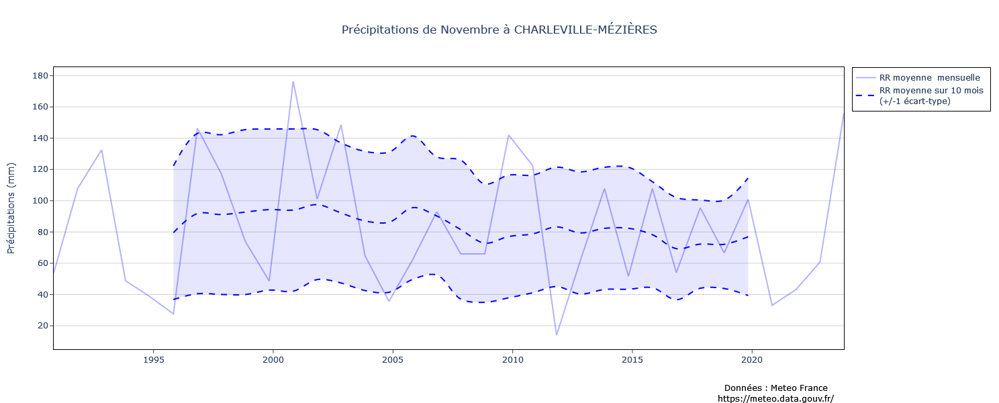

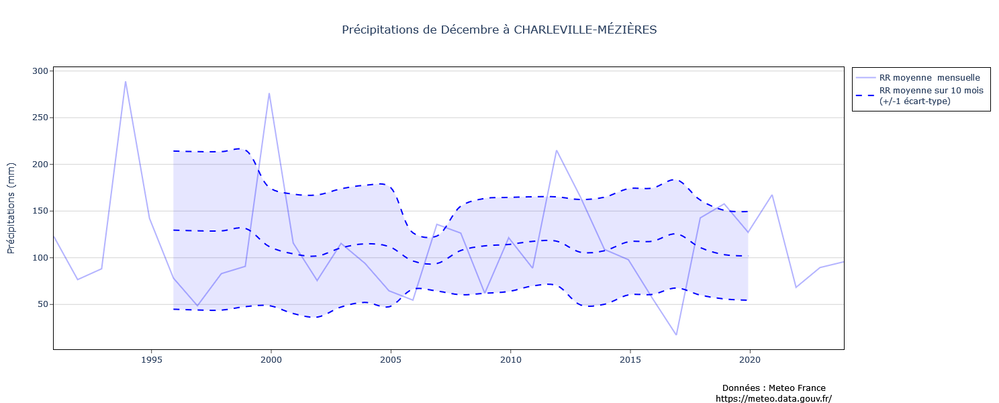

In [28]:
mois = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre'] 
for k in range(1, 13):
    graph(['blue'],['rgba(0, 0, 255, 0.1)'], ['RR'], ['Précipitations'], [' (mm)'], df1_month[df1_month.index.month == k], ['sum'], [10], ['M'], f'Précipitations de {mois[k-1]} à CHARLEVILLE-MÉZIÈRES')

# PREDICTIONS

In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12397 entries, 1990-01-01 to 2023-12-31
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RR      12397 non-null  float64
 1   TN      12397 non-null  float64
 2   TX      12397 non-null  float64
 3   TM      12383 non-null  float64
 4   TNTXM   12397 non-null  float64
 5   TAMPLI  12397 non-null  float64
 6   FFM     12315 non-null  float64
dtypes: float64(7)
memory usage: 774.8 KB


## Replace Nan values :  
TM by (TN+TX)/2  
FFM by last valid value  

In [24]:
df1['TM'] = df1['TM'].fillna((df1['TN']+df1['TX'])/2)
df1['FFM'] = df1['FFM'].fillna(method = 'ffill')

C:\Users\thepe\AppData\Local\Temp\ipykernel_20780\3923717272.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['TM'] = df1['TM'].fillna((df1['TN']+df1['TX'])/2)
C:\Users\thepe\AppData\Local\Temp\ipykernel_20780\3923717272.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df1['FFM'] = df1['FFM'].fillna(method = 'ffill')
C:\Users\thepe\AppData\Local\Temp\ipykernel_20780\3923717272.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

In [112]:
dico_y = {'RR' : 'Précipitations (mm)', 'TN' : 'Températures (°C)', 'TM' : 'Températures (°C)', 'TX' : 'Températures (°C)', 'TNTXM' : 'Températures (°C)', 'TAMPLI' : 'Écart Températures (°C)', 'FFM' : 'Vitesse du vent (m/s)' }
dico_titre = {'RR' : 'RR - Précipitations', 'TN' : 'TN - Températures minimales', 'TM' : 'TM - Températures moyennes', 'TX' : 'TX - Températures maximales', 'TNTXM' : 'TNTXM - Températures moyennes de TN et TX', 'TAMPLI' : 'Écarts de Températures', 'FFM' : 'Vitesse du vent'}



## functions

In [59]:
# create future forecast dates
def create_dates(start, days):
    v = pd.date_range(start=start, periods=days+1, freq='D', inclusive='right')
    days_forecast = pd.DataFrame(index=v) 
    return days_forecast

In [60]:
# train-test split for a user input ratio
def train_test_split(value, name, ratio):
    nrow = len(value)
    print(name+' total samples: ', nrow)
    split_row = int((nrow)*ratio)
    print('Training samples: ', split_row)
    print('Testing samples: ', nrow-split_row)
    train = value.iloc[:split_row]
    test = value.iloc[split_row:]
    return train, test, split_row     

In [61]:
# data transformation
def data_transformation(train_tract1, test_tract1):
    scaler = MinMaxScaler()
    train_tract1_scaled = scaler.fit_transform(train_tract1)
    test_tract1_scaled = scaler.fit_transform(test_tract1)          
    train_tract1_scaled_df = pd.DataFrame(train_tract1_scaled, index = train_tract1.index, columns=[train_tract1.columns[0]])
    test_tract1_scaled_df = pd.DataFrame(test_tract1_scaled,
                                         index = test_tract1.index, columns=[test_tract1.columns[0]])
    return train_tract1_scaled_df, test_tract1_scaled_df, scaler     

In [92]:
# feature builder - This section creates feature set with lag number of predictors--Creating features using lagged data
def timeseries_feature_builder(df, lag):
    df_copy = df.copy()
    data = {}
    for i in range(1, lag):
        data['lag' + str(i)] = df.shift(i)
        #df_copy['lag' + str(i)] = df.shift(i) 
    new_df = pd.concat( data.values(), axis=1, ignore_index=True)
    df_copy = pd.concat([df_copy, new_df], axis =1, ignore_index= True)
    return df_copy
   

In [64]:
# preprocessing -- drop null values and make arrays 
def make_arrays(train_tract1, test_tract1):
    X_train_tract1_array = train_tract1.dropna().drop(train_tract1.columns[0], axis=1).values
    y_train_tract1_array = train_tract1.dropna()[train_tract1.columns[0]].values
    X_test_tract1_array = test_tract1.dropna().drop(test_tract1.columns[0], axis=1).values
    y_test_tract1_array = test_tract1.dropna()[test_tract1.columns[0]].values    
    return X_train_tract1_array, y_train_tract1_array, X_test_tract1_array, y_test_tract1_array

In [65]:
# Define LSTM model
def lstm_model(units, trainX, testX, y_train_tract1_array, y_test_tract1_array):
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(trainX.shape[1],trainX.shape[2]), kernel_initializer='lecun_uniform'))
    model.add(Dropout(0.2))    
    model.add(LSTM(units, return_sequences=True))
    model.add(Dropout(0.2))    
    model.add(LSTM(units))
    model.add(Dropout(0.2))
    model.add(Dense(1))        
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    
    model.fit(trainX, y_train_tract1_array, batch_size=120, epochs=100, validation_data=(testX, y_test_tract1_array), verbose=0)
    return model

In [66]:
# validation result 
def valid_result(model, testX, y_test_tract1_array, scaler, station_value, split_row, lag):    
    testPredict = model.predict(testX)
    rSquare_test = r2_score(y_test_tract1_array, testPredict)
    print('Test R-squared is: %f'%rSquare_test)    
    testPredict = scaler.inverse_transform(testPredict)        
    new_test_tract1 = station_value.iloc[split_row:]       
    test_tract1_pred = new_test_tract1.iloc[lag:].copy()
    test_tract1_pred['Forecast'] = testPredict
    return test_tract1_pred 

In [67]:
# multi step future forecast for next days number of days. 
def forecast(model, testX, test_tract1, lag, scaler, days):
    more_days = []
    new0 = testX[-1]        
    last = test_tract1.iloc[-1]
    new_predict = last[0]        
    new_array = np.insert(new0, 0, new_predict)        
    new_array = np.delete(new_array, -1)
    new_array_reshape = np.reshape(new_array, (-1, 1, lag))       
    new_predict = model.predict(new_array_reshape)
    temp_predict = scaler.inverse_transform(new_predict) 
    more_days.append(temp_predict[0][0].round(2))
    
    for i in range(1, days):
        new_array = np.insert(new_array, 0, new_predict)             
        new_array = np.delete(new_array, -1)
        new_array_reshape = np.reshape(new_array, (-1, 1, lag))            
        new_predict = model.predict(new_array_reshape)
        temp_predict = scaler.inverse_transform(new_predict) 
        more_days.append(temp_predict[0][0].round(2))
    return more_days         

In [118]:
def graphique(test_tract1_pred, days_forecast_lstm, feature_name):
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(x=test_tract1_pred.index,
                                 y=test_tract1_pred[test_tract1_pred.columns[0]],
                                 line=dict(color='blue', width=2, shape='spline'),
                                 #showlegend=False,
                                 name = "True",                             
                                 hovertemplate = '%{x|%d %m %Y}<br>' + feature_name + ' = ' + '%{y:.1f}<extra></extra>',
                                ))
    
    fig.add_trace(go.Scatter(x=test_tract1_pred.index,
                                 y=test_tract1_pred[test_tract1_pred.columns[1]],                             
                                 line=dict(color='rgba(255, 200, 0, 1)', width=2, shape='spline'),
                                 #showlegend=False,
                                 name = "Predicted",                             
                                 hovertemplate = '%{x|%d %m %Y}<br>' + feature_name + ' predicted = ' + '%{y:.1f}<extra></extra>',
                                ))
    
    fig.add_trace(go.Scatter(x=days_forecast_lstm[feature_name].index,
                                 y=days_forecast_lstm[feature_name],                             
                                 line=dict(color='red', width=2, shape='spline'),
                                 #showlegend=False,
                                 name = "Forecast",                             
                                 hovertemplate = '%{x|%d %m %Y}<br>' + feature_name + ' forecast = ' + '%{y:.1f}<extra></extra>',
                                ))
    fig.update_layout(height=600, plot_bgcolor='white',
                      legend=dict(x=0.9, y=0.98, font=dict(size=12,), bordercolor='black', borderwidth=1),
                      title = dict(text= dico_titre[feature_name], x=0.5))
    
    fig.update_xaxes(mirror=True,
                     ticks='outside',
                     showline=True,
                     linecolor='black',
                     gridcolor='white')
        
    fig.update_yaxes(mirror=True,
                     ticks='outside',
                     showline=True,
                     linecolor='black',
                     gridcolor='lightgrey',
                     title = dico_y[feature_name]
                    )
    
    fig.add_annotation(x="2024", y=-0.2, # position
                       yref='paper',
                       text="Données : Meteo France<br>https://meteo.data.gouv.fr/", # text
                       font = dict(color = 'black'),
                       showarrow=False
                      )
           
    fig.show()

## LSTM Prediction

In [116]:
def predict_temp_lstm(df_station, last_date, lag, days):    
    
    days_forecast_lstm = create_dates(last_date, days) 
    
    for i in range(len(df_station.columns)):
        
        # preprocessing
        station_value, feature_name = df_station[[df_station.columns[i]]], df_station.columns[i]        
        train_tract1, test_tract1, split_row = train_test_split(station_value, feature_name, 0.90)        
        train_tract1_scaled_df, test_tract1_scaled_df, scaler = data_transformation(train_tract1, test_tract1) 
        train_tract1 = timeseries_feature_builder(train_tract1_scaled_df, lag+1) 
        test_tract1 = timeseries_feature_builder(test_tract1_scaled_df, lag+1)               
        X_train_tract1_array, y_train_tract1_array, X_test_tract1_array, y_test_tract1_array = make_arrays(train_tract1, test_tract1)        
        trainX = np.reshape(X_train_tract1_array, (X_train_tract1_array.shape[0], 1, X_train_tract1_array.shape[1]))
        testX = np.reshape(X_test_tract1_array, (X_test_tract1_array.shape[0], 1, X_test_tract1_array.shape[1]))                
        
        # LSTM modelling & forecast
        model = lstm_model(30, trainX, testX, y_train_tract1_array, y_test_tract1_array)             
        test_tract1_pred = valid_result(model, testX, y_test_tract1_array, scaler, station_value, split_row, lag)        
        more_days = forecast(model, testX, test_tract1, lag, scaler, days)       
        days_forecast_lstm[feature_name] = np.array(more_days)       
        
        # plot result
        """
        # matplotlib
        plt.figure(figsize=(20,5))
        plt.plot(test_tract1_pred)        
        plt.plot(days_forecast_lstm[feature_name], color='red', label='forecast')         
        plt.ylabel(dico_y[feature_name])
        plt.legend(loc='upper right')
        plt.title(feature_name + ' - Forecast for January 2024')
        plt.show()        
        """
        # plotly graph
        graphique(test_tract1_pred, days_forecast_lstm, feature_name, )
        
        
    return(days_forecast_lstm)

RR total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 882us/step
Test R-squared is: -0.102773
1/1 [==============================] - 0s 12ms/step


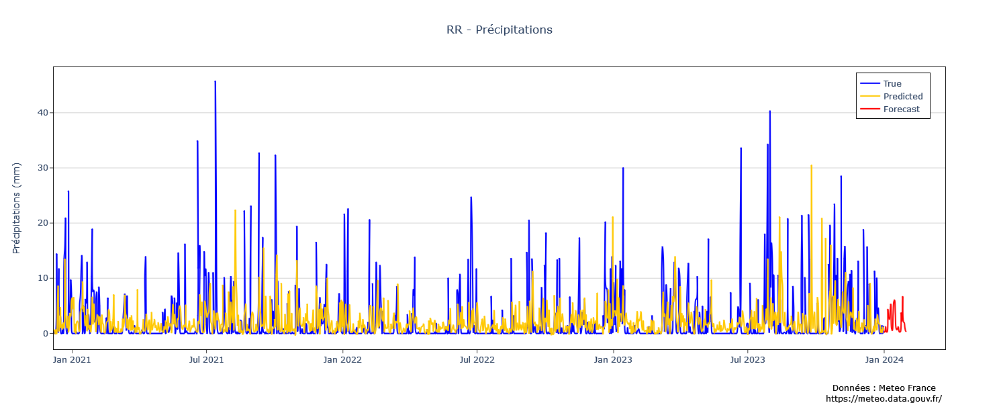

TN total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 824us/step
Test R-squared is: 0.677164
1/1 [==============================] - 0s 12ms/step


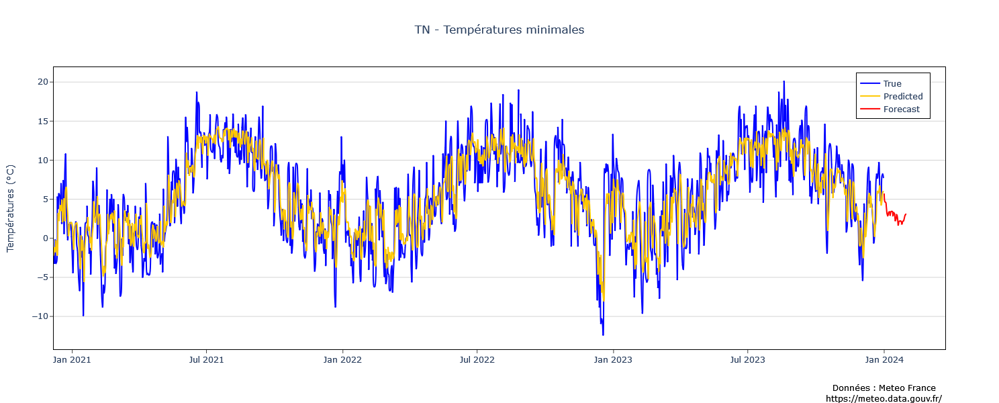

TX total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 882us/step
Test R-squared is: 0.882398
1/1 [==============================] - 0s 14ms/step


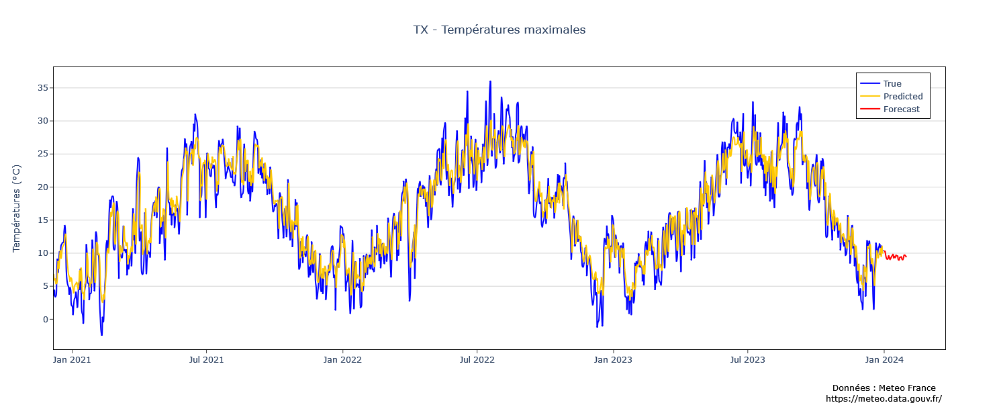

TM total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 868us/step
Test R-squared is: 0.893491
1/1 [==============================] - 0s 13ms/step


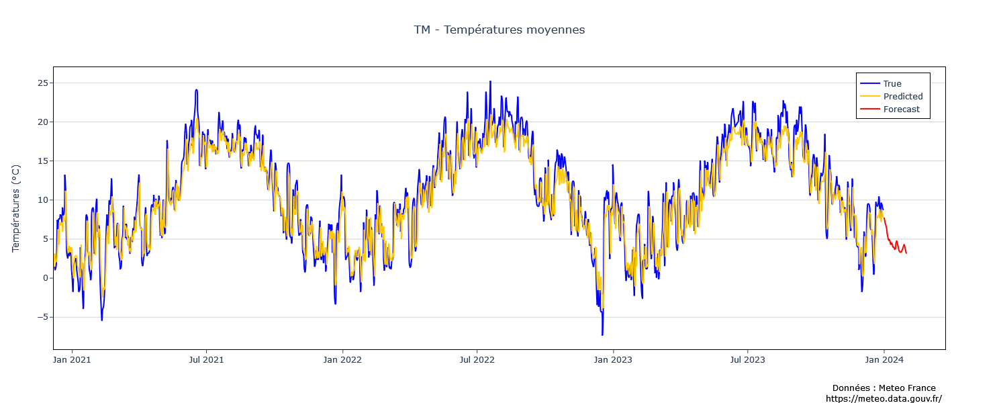

TNTXM total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 824us/step
Test R-squared is: 0.871137
1/1 [==============================] - 0s 13ms/step


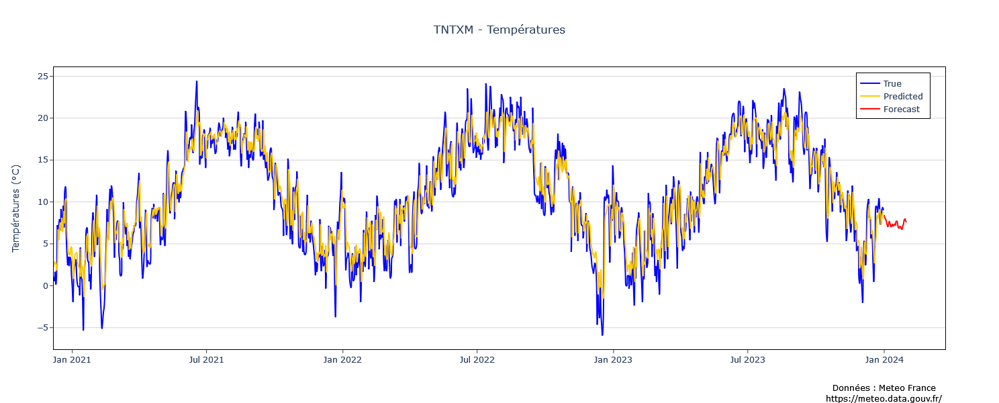

TAMPLI total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 882us/step
Test R-squared is: 0.455271
1/1 [==============================] - 0s 13ms/step


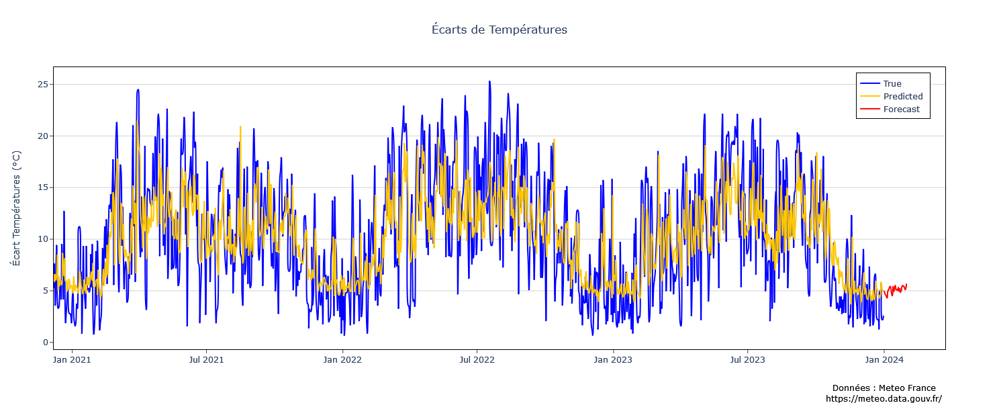

FFM total samples:  12397
Training samples:  11157
Testing samples:  1240
35/35 [==============================] - 1s 912us/step
Test R-squared is: 0.258187
1/1 [==============================] - 0s 13ms/step


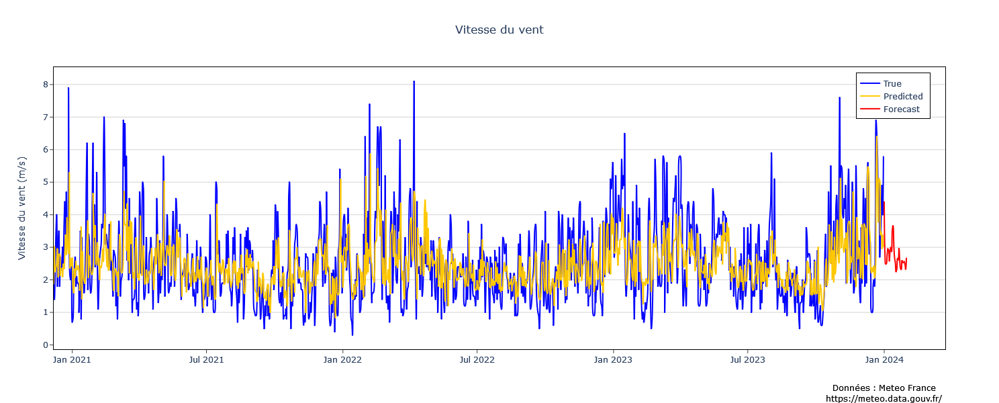

CPU times: total: 30min 11s
Wall time: 4min 27s


In [119]:
%%time
# Fitting and forecast using LSTM  -- output of train loss and valid loss is turned off
lstm_prediction = predict_temp_lstm(df1, '2023-12-31', 120, 31)